## Combine zoom out and in before augmwnting

In [16]:
import os
import shutil

def copy_files(src_dir, dest_dir):
    """
    Recursively copy files from the source directory to the destination directory,
    maintaining the directory structure.
    
    Args:
    - src_dir: The source directory to copy from
    - dest_dir: The destination directory to copy to
    """
    # Walk through the source directory
    for root, dirs, files in os.walk(src_dir):
        # Calculate relative path from the source directory
        rel_path = os.path.relpath(root, src_dir)
        # Define the corresponding destination path
        dest_path = os.path.join(dest_dir, rel_path)
        
        # Create the directories in the destination if they don't exist
        os.makedirs(dest_path, exist_ok=True)
        
        # Copy each file to the destination
        for file in files:
            src_file = os.path.join(root, file)
            dest_file = os.path.join(dest_path, file)
            shutil.copy2(src_file, dest_file)  # copy2 to preserve file metadata
            print(f"Copied: {src_file} -> {dest_file}")

def main():
    # Define source and destination directories
    src_train_dir = "F:/ds-final-ben-zoomout/train"
    src_val_dir = "F:/ds-final-ben-zoomout/val"
    dest_train_dir = "F:/ds-final-ben/train"
    dest_val_dir = "F:/ds-final-ben/val"
    
    # Copy from dsout/train to dstest/train
    print("Copying files from dsout/train to dstest/train...")
    copy_files(src_train_dir, dest_train_dir)
    
    # Copy from dsout/val to dstest/val
    print("Copying files from dsout/val to dstest/val...")
    copy_files(src_val_dir, dest_val_dir)
    
    print("\nFiles copied successfully!")

if __name__ == "__main__":
    main()


Copying files from dsout/train to dstest/train...
Copied: F:/ds-final-ben-zoomout/train\class0\images\env_Balete-A-1-_jpg.rf.c2d2ff5287272374ef6c572dcc59bc13(z0.68).jpg -> F:/ds-final-ben/train\class0\images\env_Balete-A-1-_jpg.rf.c2d2ff5287272374ef6c572dcc59bc13(z0.68).jpg
Copied: F:/ds-final-ben-zoomout/train\class0\images\env_Balete-A-1-_jpg.rf.c2d2ff5287272374ef6c572dcc59bc13(z0.76).jpg -> F:/ds-final-ben/train\class0\images\env_Balete-A-1-_jpg.rf.c2d2ff5287272374ef6c572dcc59bc13(z0.76).jpg
Copied: F:/ds-final-ben-zoomout/train\class0\images\env_Balete-A-1-_jpg.rf.c2d2ff5287272374ef6c572dcc59bc13(z0.88).jpg -> F:/ds-final-ben/train\class0\images\env_Balete-A-1-_jpg.rf.c2d2ff5287272374ef6c572dcc59bc13(z0.88).jpg
Copied: F:/ds-final-ben-zoomout/train\class0\images\env_Balete-A-10-_jpg.rf.3d1e4476eaaacc20166fc00024a9ecb0(z0.64).jpg -> F:/ds-final-ben/train\class0\images\env_Balete-A-10-_jpg.rf.3d1e4476eaaacc20166fc00024a9ecb0(z0.64).jpg
Copied: F:/ds-final-ben-zoomout/train\class0\ima

## Visualize Combined Zoom In and Zoom Out

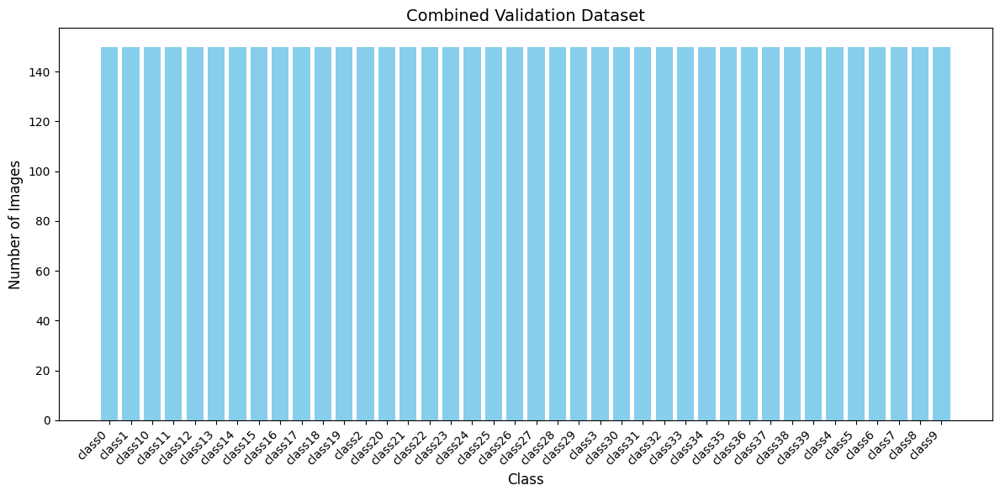

In [17]:
import os
import matplotlib.pyplot as plt

# Path to your training dataset
train_dir = "F:/ds-final-ben/val"

# Count images per class
class_counts = {}

for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name, "images")
    if os.path.isdir(class_path):
        class_counts[class_name] = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])

# Sort the counts for better visualization
class_counts = dict(sorted(class_counts.items(), key=lambda x: x[0]))

# Plot the chart
plt.figure(figsize=(12, 6))
plt.bar(class_counts.keys(), class_counts.values(), color="skyblue")
plt.xlabel("Class", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)
plt.title("Combined Validation Dataset", fontsize=14)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.tight_layout()
plt.show()


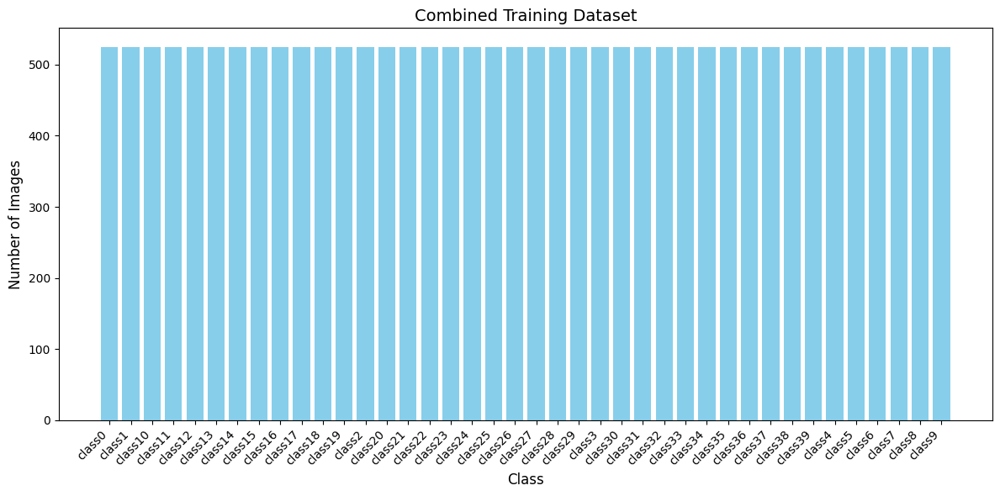

In [18]:
import os
import matplotlib.pyplot as plt

# Path to your training dataset
train_dir = "F:/ds-final-ben/train"

# Count images per class
class_counts = {}

for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name, "images")
    if os.path.isdir(class_path):
        class_counts[class_name] = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])

# Sort the counts for better visualization
class_counts = dict(sorted(class_counts.items(), key=lambda x: x[0]))

# Plot the chart
plt.figure(figsize=(12, 6))
plt.bar(class_counts.keys(), class_counts.values(), color="skyblue")
plt.xlabel("Class", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)
plt.title("Combined Training Dataset", fontsize=14)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.tight_layout()
plt.show()


## Generate Rotations for Train and Val

In [19]:
import os
import cv2
import numpy as np
import shutil

def rotate_box(box, angle, image_width, image_height):
    """Rotate a YOLO bounding box."""
    # Convert YOLO format to absolute coordinates
    x_center, y_center = box[1] * image_width, box[2] * image_height
    width, height = box[3] * image_width, box[4] * image_height
    
    # Calculate corners
    x1 = x_center - width / 2
    y1 = y_center - height / 2
    x2 = x_center + width / 2
    y2 = y_center + height / 2
    
    # Create rotation matrix
    center = (image_width / 2, image_height / 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    
    # Rotate corners
    points = np.array([[x1, y1], [x2, y1], [x2, y2], [x1, y2]], dtype=np.float32)
    rotated_points = np.array([rotation_matrix.dot([p[0], p[1], 1]) for p in points])
    
    # Get new bounding box
    x_min = np.min(rotated_points[:, 0])
    y_min = np.min(rotated_points[:, 1])
    x_max = np.max(rotated_points[:, 0])
    y_max = np.max(rotated_points[:, 1])
    
    # Convert back to YOLO format
    new_x_center = (x_min + x_max) / 2 / image_width
    new_y_center = (y_min + y_max) / 2 / image_height
    new_width = (x_max - x_min) / image_width
    new_height = (y_max - y_min) / image_height
    
    # Clip values to ensure they stay within [0, 1]
    new_x_center = np.clip(new_x_center, 0, 1)
    new_y_center = np.clip(new_y_center, 0, 1)
    new_width = np.clip(new_width, 0, 1)
    new_height = np.clip(new_height, 0, 1)
    
    return [box[0], new_x_center, new_y_center, new_width, new_height]

def augment_class(original_class_path, target_count, angles=[90, 180, 270]):
    """Augment images and labels for a specific class until reaching target count."""
    images_path = os.path.join(original_class_path, "images")
    labels_path = os.path.join(original_class_path, "labels")
    
    # Copy original files first
    image_files = [f for f in os.listdir(images_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
    current_count = len(image_files)
    if current_count >= target_count:
        return
    
    augmentation_needed = target_count - current_count
    aug_counter = 0
    angle_idx = 0
    
    while aug_counter < augmentation_needed:
        for img_file in image_files:
            if aug_counter >= augmentation_needed:
                break
                
            label_file = img_file.rsplit('.', 1)[0] + '.txt'
            img_path = os.path.join(images_path, img_file)
            label_path = os.path.join(labels_path, label_file)
            
            if not os.path.exists(label_path):
                continue
                
            img = cv2.imread(img_path)
            height, width = img.shape[:2]
            
            angle = angles[angle_idx % len(angles)]
            rotation_matrix = cv2.getRotationMatrix2D((width / 2, height / 2), angle, 1.0)
            rotated_img = cv2.warpAffine(img, rotation_matrix, (width, height))
            
            with open(label_path, 'r') as f:
                labels = [line.strip().split() for line in f.readlines()]
            
            rotated_labels = []
            for label in labels:
                label = [float(x) if i > 0 else int(x) for i, x in enumerate(label)]
                rotated_label = rotate_box(label, angle, width, height)
                rotated_labels.append(rotated_label)
            
            aug_suffix = f'_aug_{angle}_{aug_counter}'
            new_img_file = f"{img_file.rsplit('.', 1)[0]}{aug_suffix}.{img_file.rsplit('.', 1)[1]}"
            new_label_file = f"{label_file.rsplit('.', 1)[0]}{aug_suffix}.txt"
            
            cv2.imwrite(os.path.join(images_path, new_img_file), rotated_img)
            
            with open(os.path.join(labels_path, new_label_file), 'w') as f:
                for label in rotated_labels:
                    f.write(f"{int(label[0])} {' '.join(str(x) for x in label[1:])}\n")
            
            aug_counter += 1
            angle_idx += 1

def balance_dataset(train_dir, target_count=None):
    """Balance the dataset by augmenting classes with fewer images."""
    # Count images per class
    class_counts = {}
    for class_name in os.listdir(train_dir):
        class_path = os.path.join(train_dir, class_name, "images")
        if os.path.isdir(class_path):
            class_counts[class_name] = len([f for f in os.listdir(class_path) 
                                          if os.path.isfile(os.path.join(class_path, f))])
    
    # If target_count not specified, use the maximum class count
    if target_count is None:
        target_count = max(class_counts.values())
    
    print(f"Target count per class: {target_count}")
    
    # Process each class
    for class_name, count in class_counts.items():
        print(f"\nProcessing class '{class_name}' ({count} images)")
        original_class_path = os.path.join(train_dir, class_name)
        augment_class(original_class_path, target_count)
        
        # Verify new count
        new_count = len([f for f in os.listdir(os.path.join(original_class_path, "images")) 
                        if os.path.isfile(os.path.join(original_class_path, "images", f))])
        print(f"Augmented '{class_name}' to {new_count} images")
    
    print(f"\nDataset augmentation complete.")

# Example usage
if __name__ == "__main__":
    train_dir = "F:/ds-final-ben/train"
    balance_dataset(train_dir, target_count=1050)  # 349 is the size of the largest class


Target count per class: 1050

Processing class 'class0' (525 images)
Augmented 'class0' to 1050 images

Processing class 'class1' (525 images)
Augmented 'class1' to 1050 images

Processing class 'class10' (525 images)
Augmented 'class10' to 1050 images

Processing class 'class11' (525 images)
Augmented 'class11' to 1050 images

Processing class 'class12' (525 images)
Augmented 'class12' to 1050 images

Processing class 'class13' (525 images)
Augmented 'class13' to 1050 images

Processing class 'class14' (525 images)
Augmented 'class14' to 1050 images

Processing class 'class15' (525 images)
Augmented 'class15' to 1050 images

Processing class 'class16' (525 images)
Augmented 'class16' to 1050 images

Processing class 'class17' (525 images)
Augmented 'class17' to 1050 images

Processing class 'class18' (525 images)
Augmented 'class18' to 1050 images

Processing class 'class19' (525 images)
Augmented 'class19' to 1050 images

Processing class 'class2' (525 images)
Augmented 'class2' to 1

In [20]:
import os
import cv2
import numpy as np
import shutil

def rotate_box(box, angle, image_width, image_height):
    """Rotate a YOLO bounding box."""
    # Convert YOLO format to absolute coordinates
    x_center, y_center = box[1] * image_width, box[2] * image_height
    width, height = box[3] * image_width, box[4] * image_height
    
    # Calculate corners
    x1 = x_center - width / 2
    y1 = y_center - height / 2
    x2 = x_center + width / 2
    y2 = y_center + height / 2
    
    # Create rotation matrix
    center = (image_width / 2, image_height / 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    
    # Rotate corners
    points = np.array([[x1, y1], [x2, y1], [x2, y2], [x1, y2]], dtype=np.float32)
    rotated_points = np.array([rotation_matrix.dot([p[0], p[1], 1]) for p in points])
    
    # Get new bounding box
    x_min = np.min(rotated_points[:, 0])
    y_min = np.min(rotated_points[:, 1])
    x_max = np.max(rotated_points[:, 0])
    y_max = np.max(rotated_points[:, 1])
    
    # Convert back to YOLO format
    new_x_center = (x_min + x_max) / 2 / image_width
    new_y_center = (y_min + y_max) / 2 / image_height
    new_width = (x_max - x_min) / image_width
    new_height = (y_max - y_min) / image_height
    
    # Clip values to ensure they stay within [0, 1]
    new_x_center = np.clip(new_x_center, 0, 1)
    new_y_center = np.clip(new_y_center, 0, 1)
    new_width = np.clip(new_width, 0, 1)
    new_height = np.clip(new_height, 0, 1)
    
    return [box[0], new_x_center, new_y_center, new_width, new_height]

def augment_class(original_class_path, target_count, angles=[90, 180, 270]):
    """Augment images and labels for a specific class until reaching target count."""
    images_path = os.path.join(original_class_path, "images")
    labels_path = os.path.join(original_class_path, "labels")
    
    # Copy original files first
    image_files = [f for f in os.listdir(images_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
    current_count = len(image_files)
    if current_count >= target_count:
        return
    
    augmentation_needed = target_count - current_count
    aug_counter = 0
    angle_idx = 0
    
    while aug_counter < augmentation_needed:
        for img_file in image_files:
            if aug_counter >= augmentation_needed:
                break
                
            label_file = img_file.rsplit('.', 1)[0] + '.txt'
            img_path = os.path.join(images_path, img_file)
            label_path = os.path.join(labels_path, label_file)
            
            if not os.path.exists(label_path):
                continue
                
            img = cv2.imread(img_path)
            height, width = img.shape[:2]
            
            angle = angles[angle_idx % len(angles)]
            rotation_matrix = cv2.getRotationMatrix2D((width / 2, height / 2), angle, 1.0)
            rotated_img = cv2.warpAffine(img, rotation_matrix, (width, height))
            
            with open(label_path, 'r') as f:
                labels = [line.strip().split() for line in f.readlines()]
            
            rotated_labels = []
            for label in labels:
                label = [float(x) if i > 0 else int(x) for i, x in enumerate(label)]
                rotated_label = rotate_box(label, angle, width, height)
                rotated_labels.append(rotated_label)
            
            aug_suffix = f'_aug_{angle}_{aug_counter}'
            new_img_file = f"{img_file.rsplit('.', 1)[0]}{aug_suffix}.{img_file.rsplit('.', 1)[1]}"
            new_label_file = f"{label_file.rsplit('.', 1)[0]}{aug_suffix}.txt"
            
            cv2.imwrite(os.path.join(images_path, new_img_file), rotated_img)
            
            with open(os.path.join(labels_path, new_label_file), 'w') as f:
                for label in rotated_labels:
                    f.write(f"{int(label[0])} {' '.join(str(x) for x in label[1:])}\n")
            
            aug_counter += 1
            angle_idx += 1

def balance_dataset(train_dir, target_count=None):
    """Balance the dataset by augmenting classes with fewer images."""
    # Count images per class
    class_counts = {}
    for class_name in os.listdir(train_dir):
        class_path = os.path.join(train_dir, class_name, "images")
        if os.path.isdir(class_path):
            class_counts[class_name] = len([f for f in os.listdir(class_path) 
                                          if os.path.isfile(os.path.join(class_path, f))])
    
    # If target_count not specified, use the maximum class count
    if target_count is None:
        target_count = max(class_counts.values())
    
    print(f"Target count per class: {target_count}")
    
    # Process each class
    for class_name, count in class_counts.items():
        print(f"\nProcessing class '{class_name}' ({count} images)")
        original_class_path = os.path.join(train_dir, class_name)
        augment_class(original_class_path, target_count)
        
        # Verify new count
        new_count = len([f for f in os.listdir(os.path.join(original_class_path, "images")) 
                        if os.path.isfile(os.path.join(original_class_path, "images", f))])
        print(f"Augmented '{class_name}' to {new_count} images")
    
    print(f"\nDataset augmentation complete.")

# Example usage
if __name__ == "__main__":
    train_dir = "F:/ds-final-ben/val"
    balance_dataset(train_dir, target_count=300)  # 349 is the size of the largest class


Target count per class: 300

Processing class 'class0' (150 images)
Augmented 'class0' to 300 images

Processing class 'class1' (150 images)
Augmented 'class1' to 300 images

Processing class 'class10' (150 images)
Augmented 'class10' to 300 images

Processing class 'class11' (150 images)
Augmented 'class11' to 300 images

Processing class 'class12' (150 images)
Augmented 'class12' to 300 images

Processing class 'class13' (150 images)
Augmented 'class13' to 300 images

Processing class 'class14' (150 images)
Augmented 'class14' to 300 images

Processing class 'class15' (150 images)
Augmented 'class15' to 300 images

Processing class 'class16' (150 images)
Augmented 'class16' to 300 images

Processing class 'class17' (150 images)
Augmented 'class17' to 300 images

Processing class 'class18' (150 images)
Augmented 'class18' to 300 images

Processing class 'class19' (150 images)
Augmented 'class19' to 300 images

Processing class 'class2' (150 images)
Augmented 'class2' to 300 images

Pr

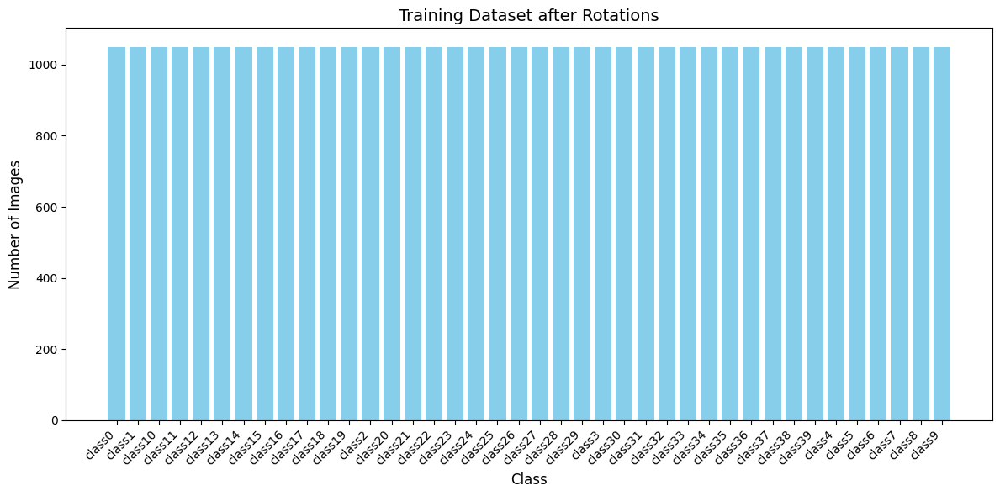

In [21]:
import os
import matplotlib.pyplot as plt

# Path to your training dataset
train_dir = "F:/ds-final-ben/train"

# Count images per class
class_counts = {}

for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name, "images")
    if os.path.isdir(class_path):
        class_counts[class_name] = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])

# Sort the counts for better visualization
class_counts = dict(sorted(class_counts.items(), key=lambda x: x[0]))

# Plot the chart
plt.figure(figsize=(12, 6))
plt.bar(class_counts.keys(), class_counts.values(), color="skyblue")
plt.xlabel("Class", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)
plt.title("Training Dataset after Rotations", fontsize=14)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.tight_layout()
plt.show()


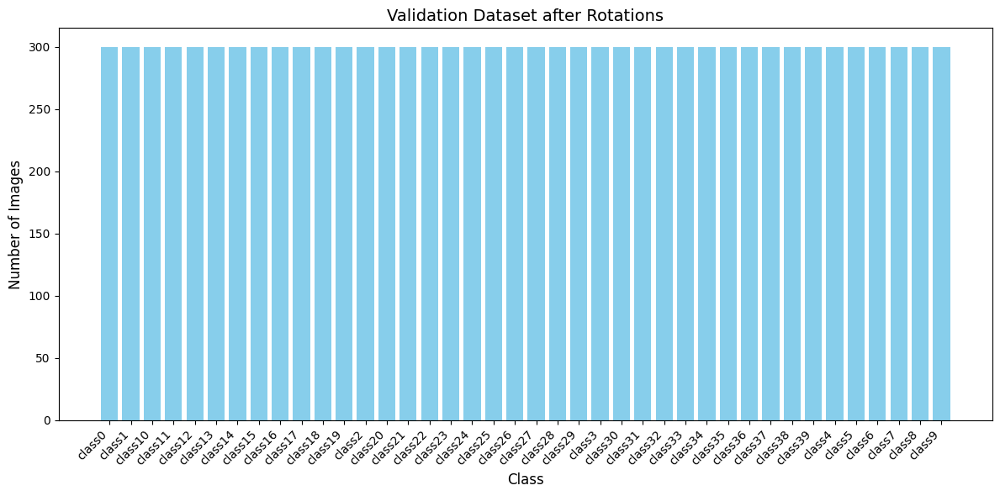

In [22]:
import os
import matplotlib.pyplot as plt

# Path to your training dataset
train_dir = "F:/ds-final-ben/val"

# Count images per class
class_counts = {}

for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name, "images")
    if os.path.isdir(class_path):
        class_counts[class_name] = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])

# Sort the counts for better visualization
class_counts = dict(sorted(class_counts.items(), key=lambda x: x[0]))

# Plot the chart
plt.figure(figsize=(12, 6))
plt.bar(class_counts.keys(), class_counts.values(), color="skyblue")
plt.xlabel("Class", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)
plt.title("Validation Dataset after Rotations", fontsize=14)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.tight_layout()
plt.show()


## Plot Random Samples from Train

Plotting random samples from the dataset...


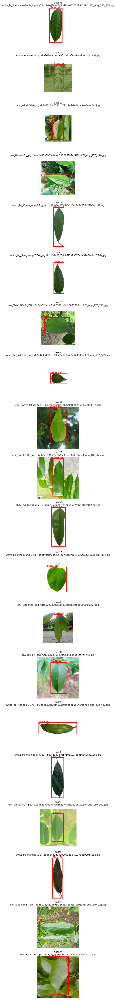

Done!


In [23]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def plot_image_with_boxes(image_path, label_path, ax, title):
    """Plot an image with its bounding boxes and title"""
    # Load image
    image = Image.open(image_path)
    img_width, img_height = image.size

    # Plot image
    ax.imshow(image)
    ax.axis('off')
    ax.set_title(title, fontsize=10, wrap=True)

    # Read and plot bounding boxes
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                class_id = int(parts[0])
                x_center, y_center, width, height = map(float, parts[1:])

                # Convert YOLO format to corner coordinates
                x_min = (x_center - width / 2) * img_width
                y_min = (y_center - height / 2) * img_height
                box_width = width * img_width
                box_height = height * img_height

                # Draw bounding box
                rect = patches.Rectangle(
                    (x_min, y_min), box_width, box_height,
                    linewidth=2, edgecolor='r', facecolor='none'
                )
                ax.add_patch(rect)
                ax.text(x_min, y_min - 5, f"Class {class_id}", 
                        color='red', fontsize=10, weight='bold')

def plot_random_dataset_samples(base_path, num_samples=20, figsize=(3, 3)):
    """Plot random samples from the dataset in a single column"""
    # Get all class directories
    class_dirs = [d for d in os.listdir(base_path) if d.startswith('class')]
    
    # Collect all image paths and their corresponding label paths
    all_images = []
    for class_dir in class_dirs:
        images_dir = os.path.join(base_path, class_dir, 'images')
        labels_dir = os.path.join(base_path, class_dir, 'labels')
        
        for image_file in os.listdir(images_dir):
            if image_file.endswith(('.jpg', '.jpeg', '.png')):
                image_path = os.path.join(images_dir, image_file)
                label_path = os.path.join(labels_dir, 
                                        os.path.splitext(image_file)[0] + '.txt')
                all_images.append((image_path, label_path, class_dir))
    
    # Randomly select images
    selected_images = random.sample(all_images, min(num_samples, len(all_images)))
    
    # Create subplot grid for a single column
    num_rows = len(selected_images)
    fig, axs = plt.subplots(num_rows, 1, figsize=(figsize[0], num_rows * figsize[1]))
    
    if num_rows == 1:  # Handle case where only one sample is selected
        axs = [axs]
    
    # Plot each selected image
    for i, (image_path, label_path, class_dir) in enumerate(selected_images):
        # Create title from filename and class
        filename = os.path.basename(image_path)
        title = f"{class_dir}\n{filename}"
        
        # Plot image with boxes
        plot_image_with_boxes(image_path, label_path, axs[i], title)
    
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    # Path to your dataset directory containing class0, class1, etc.
    dataset_path = "F:/ds-final-ben/train"  # Adjust this to your dataset path
    
    print("Plotting random samples from the dataset...")
    plot_random_dataset_samples(dataset_path, num_samples=20)
    print("Done!")


## Plot Random Samples from Val

Plotting random samples from the dataset...


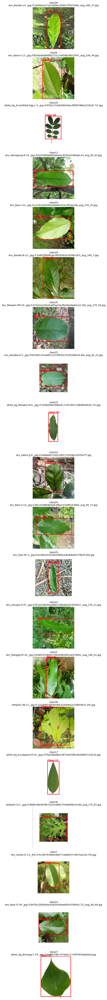

Done!


In [24]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def plot_image_with_boxes(image_path, label_path, ax, title):
    """Plot an image with its bounding boxes and title"""
    # Load image
    image = Image.open(image_path)
    img_width, img_height = image.size

    # Plot image
    ax.imshow(image)
    ax.axis('off')
    ax.set_title(title, fontsize=10, wrap=True)

    # Read and plot bounding boxes
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                class_id = int(parts[0])
                x_center, y_center, width, height = map(float, parts[1:])

                # Convert YOLO format to corner coordinates
                x_min = (x_center - width / 2) * img_width
                y_min = (y_center - height / 2) * img_height
                box_width = width * img_width
                box_height = height * img_height

                # Draw bounding box
                rect = patches.Rectangle(
                    (x_min, y_min), box_width, box_height,
                    linewidth=2, edgecolor='r', facecolor='none'
                )
                ax.add_patch(rect)
                ax.text(x_min, y_min - 5, f"Class {class_id}", 
                        color='red', fontsize=10, weight='bold')

def plot_random_dataset_samples(base_path, num_samples=20, figsize=(3, 3)):
    """Plot random samples from the dataset in a single column"""
    # Get all class directories
    class_dirs = [d for d in os.listdir(base_path) if d.startswith('class')]
    
    # Collect all image paths and their corresponding label paths
    all_images = []
    for class_dir in class_dirs:
        images_dir = os.path.join(base_path, class_dir, 'images')
        labels_dir = os.path.join(base_path, class_dir, 'labels')
        
        for image_file in os.listdir(images_dir):
            if image_file.endswith(('.jpg', '.jpeg', '.png')):
                image_path = os.path.join(images_dir, image_file)
                label_path = os.path.join(labels_dir, 
                                        os.path.splitext(image_file)[0] + '.txt')
                all_images.append((image_path, label_path, class_dir))
    
    # Randomly select images
    selected_images = random.sample(all_images, min(num_samples, len(all_images)))
    
    # Create subplot grid for a single column
    num_rows = len(selected_images)
    fig, axs = plt.subplots(num_rows, 1, figsize=(figsize[0], num_rows * figsize[1]))
    
    if num_rows == 1:  # Handle case where only one sample is selected
        axs = [axs]
    
    # Plot each selected image
    for i, (image_path, label_path, class_dir) in enumerate(selected_images):
        # Create title from filename and class
        filename = os.path.basename(image_path)
        title = f"{class_dir}\n{filename}"
        
        # Plot image with boxes
        plot_image_with_boxes(image_path, label_path, axs[i], title)
    
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    # Path to your dataset directory containing class0, class1, etc.
    dataset_path = "F:/ds-final-ben/val"  # Adjust this to your dataset path
    
    print("Plotting random samples from the dataset...")
    plot_random_dataset_samples(dataset_path, num_samples=20)
    print("Done!")


## Plot Specific Images

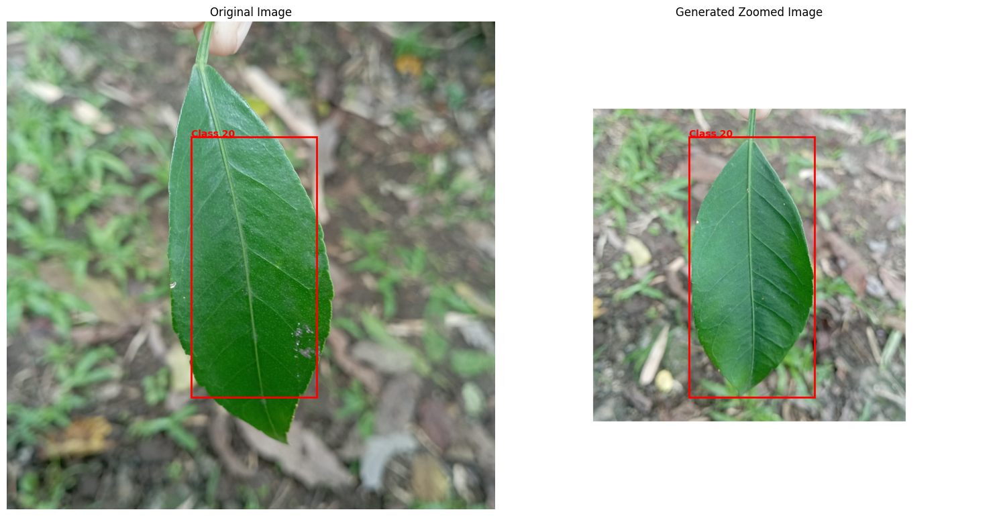

In [1]:
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Function to plot image with bounding boxes and original image side by side
def plot_original_and_zoomed(original_image_path, zoomed_image_path, original_label_path, zoomed_label_path):
    # Load images
    original_image = Image.open(original_image_path)
    zoomed_image = Image.open(zoomed_image_path)
    img_width, img_height = zoomed_image.size

    # Create a figure with two subplots for the original and zoomed images
    fig, axs = plt.subplots(1, 2, figsize=(15, 10))

    # Plot the original image
    axs[0].imshow(original_image)
    axs[0].axis('off')
    axs[0].set_title("Original Image")

    # Plot the zoomed image with bounding boxes
    axs[1].imshow(zoomed_image)
    axs[1].axis('off')
    axs[1].set_title("Generated Zoomed Image")

    # Read and plot bounding boxes for the original image
    with open(original_label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            class_id = int(parts[0])
            x_center, y_center, width, height = map(float, parts[1:])

            # Convert YOLO format to corner coordinates
            x_min = (x_center - width / 2) * img_width
            y_min = (y_center - height / 2) * img_height
            x_max = (x_center + width / 2) * img_width
            y_max = (y_center + height / 2) * img_height

            # Draw bounding box on the original image
            rect = patches.Rectangle(
                (x_min, y_min), x_max - x_min, y_max - y_min,
                linewidth=2, edgecolor='r', facecolor='none'
            )
            axs[0].add_patch(rect)
            axs[0].text(x_min, y_min - 5, f"Class {class_id}", color='red', fontsize=10, weight='bold')

    # Read and plot bounding boxes for the zoomed image
    with open(zoomed_label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            class_id = int(parts[0])
            x_center, y_center, width, height = map(float, parts[1:])

            # Convert YOLO format to corner coordinates
            x_min = (x_center - width / 2) * img_width
            y_min = (y_center - height / 2) * img_height
            x_max = (x_center + width / 2) * img_width
            y_max = (y_center + height / 2) * img_height

            # Draw bounding box on the zoomed image
            rect = patches.Rectangle(
                (x_min, y_min), x_max - x_min, y_max - y_min,
                linewidth=2, edgecolor='r', facecolor='none'
            )
            axs[1].add_patch(rect)
            axs[1].text(x_min, y_min - 5, f"Class {class_id}", color='red', fontsize=10, weight='bold')

    plt.tight_layout()
    plt.show()

# File paths
original_image_path = r"F:\ds-final-ben\val\class20\images\env_Sintores-BB-3-_jpg.rf.338710b3264ed23506464b3ae20551c1.jpg"
zoomed_image_path = r"F:\ds-final-ben-zoomout\train\class20\images\env_Sintores-BB-1-_jpg.rf.729334afe8300986f40a013d675df574(z0.64).jpg"
original_label_path = r"F:\ds-final-ben\train\class20\labels\env_Sintores-BB-1-_jpg.rf.729334afe8300986f40a013d675df574(z0.64).txt"
zoomed_label_path = r"F:\ds-final-ben-zoomout\train\class20\labels\env_Sintores-BB-1-_jpg.rf.729334afe8300986f40a013d675df574(z0.64).txt"

# Plot the original and zoomed images with bounding boxes
plot_original_and_zoomed(original_image_path, zoomed_image_path, original_label_path, zoomed_label_path)


## Verify if the Bounding Box from the Augmented images matches the labels

## Restructure Data for Training Object Detection Model

In [29]:
import os
import shutil

# Source and destination paths
source_dir = "F:/ds-final-ben"
dest_dir = "F:/ds-final-obj40"

def copy_files(source, destination):
    if not os.path.exists(destination):
        os.makedirs(destination)

    for root, _, files in os.walk(source):
        for file in files:
            file_path = os.path.join(root, file)
            shutil.copy(file_path, destination)

# Paths for train and val datasets
train_images_dest = os.path.join(dest_dir, "train", "images")
train_labels_dest = os.path.join(dest_dir, "train", "labels")
val_images_dest = os.path.join(dest_dir, "val", "images")
val_labels_dest = os.path.join(dest_dir, "val", "labels")

# Function to copy images and labels
print("Copying training images and labels...")
for class_idx in range(40):
    class_path = f"class{class_idx}"
    print(f"Processing train class: {class_path}")
    copy_files(os.path.join(source_dir, "train", class_path, "images"), train_images_dest)
    copy_files(os.path.join(source_dir, "train", class_path, "labels"), train_labels_dest)

print("Copying validation images and labels...")
for class_idx in range(40):
    class_path = f"class{class_idx}"
    print(f"Processing val class: {class_path}")
    copy_files(os.path.join(source_dir, "val", class_path, "images"), val_images_dest)
    copy_files(os.path.join(source_dir, "val", class_path, "labels"), val_labels_dest)

print("Dataset reorganization complete.")

Copying training images and labels...
Processing train class: class0
Processing train class: class1
Processing train class: class2
Processing train class: class3
Processing train class: class4
Processing train class: class5
Processing train class: class6
Processing train class: class7
Processing train class: class8
Processing train class: class9
Processing train class: class10
Processing train class: class11
Processing train class: class12
Processing train class: class13
Processing train class: class14
Processing train class: class15
Processing train class: class16
Processing train class: class17
Processing train class: class18
Processing train class: class19
Processing train class: class20
Processing train class: class21
Processing train class: class22
Processing train class: class23
Processing train class: class24
Processing train class: class25
Processing train class: class26
Processing train class: class27
Processing train class: class28
Processing train class: class29
Processing t

## Train using yolov8

In [1]:
from ultralytics import YOLO
from datetime import datetime

# Load the model
model = YOLO('yolov8n.pt') 

# Record the start time
start_time = datetime.now()
print(f"Training started at: {start_time}")
print("--------------------------------------")


# Train the model
train_results = model.train(data="F://data.yaml", epochs=50, imgsz=640, batch=8, device=0)

# Record the end time
end_time = datetime.now()
print("--------------------------------------")
print(f"Training ended at: {end_time}")

# Calculate the duration
duration = end_time - start_time
print("--------------------------------------")
print(f"Training duration: {duration}")

Training started at: 2025-01-13 09:29:07.979732
--------------------------------------
New https://pypi.org/project/ultralytics/8.3.59 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.57  Python-3.9.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3060 Ti, 8192MiB)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=F://data.yaml, epochs=50, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train7, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, 

train: Scanning F:\ds-final-obj40\train\labels... 42000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 42000/42000 [16:40<00:00, 42.00it/s]  


train: New cache created: F:\ds-final-obj40\train\labels.cache


val: Scanning F:\ds-final-obj40\val\labels... 12000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 12000/12000 [04:22<00:00, 45.75it/s]


val: New cache created: F:\ds-final-obj40\val\labels.cache
Plotting labels to runs\detect\train7\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\train7
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      1.25G     0.5563      3.014      1.119         18        640: 100%|██████████| 5250/5250 [27:35<00:00,  3.17it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [05:55<00:00,  2.11it/s]


                   all      12000      12712       0.64      0.667      0.709      0.651

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      1.29G     0.5524      1.766      1.078         21        640: 100%|██████████| 5250/5250 [30:01<00:00,  2.91it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [06:33<00:00,  1.91it/s] 


                   all      12000      12712      0.823      0.823      0.877      0.823

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      1.27G     0.5949      1.446      1.092         17        640: 100%|██████████| 5250/5250 [27:39<00:00,  3.16it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [06:15<00:00,  2.00it/s]  


                   all      12000      12712      0.841      0.857       0.91      0.849

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      1.27G     0.5837      1.177      1.086         18        640: 100%|██████████| 5250/5250 [26:40<00:00,  3.28it/s] 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [06:18<00:00,  1.98it/s]


                   all      12000      12712      0.896      0.891      0.946      0.894

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      1.26G     0.5352     0.9616      1.064         26        640: 100%|██████████| 5250/5250 [29:14<00:00,  2.99it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [05:57<00:00,  2.10it/s]


                   all      12000      12712      0.927      0.911      0.961      0.914

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      1.26G     0.5045     0.8396      1.047         20        640: 100%|██████████| 5250/5250 [28:12<00:00,  3.10it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [06:25<00:00,  1.94it/s]


                   all      12000      12712      0.939      0.925      0.966      0.926

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      1.26G     0.4886     0.7764       1.04         25        640: 100%|██████████| 5250/5250 [30:14<00:00,  2.89it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [05:55<00:00,  2.11it/s]


                   all      12000      12712      0.948      0.925      0.971      0.932

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      1.26G      0.474     0.7194      1.032         20        640: 100%|██████████| 5250/5250 [25:35<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [06:11<00:00,  2.02it/s]


                   all      12000      12712      0.963      0.935      0.975      0.942

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      1.26G     0.4591      0.682      1.025         18        640: 100%|██████████| 5250/5250 [27:35<00:00,  3.17it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [05:47<00:00,  2.16it/s]


                   all      12000      12712      0.954      0.944      0.977      0.946

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      1.26G     0.4539     0.6491      1.024         14        640: 100%|██████████| 5250/5250 [30:03<00:00,  2.91it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [06:22<00:00,  1.96it/s]


                   all      12000      12712       0.97      0.934      0.978      0.947

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      1.26G     0.4483     0.6266      1.019         22        640: 100%|██████████| 5250/5250 [27:34<00:00,  3.17it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [06:08<00:00,  2.03it/s]


                   all      12000      12712      0.966      0.941      0.979       0.95

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      1.26G     0.4405     0.6006      1.016         19        640: 100%|██████████| 5250/5250 [29:42<00:00,  2.95it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [06:24<00:00,  1.95it/s]


                   all      12000      12712      0.972       0.94      0.979      0.952

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      1.26G     0.4333     0.5806      1.012         13        640: 100%|██████████| 5250/5250 [28:54<00:00,  3.03it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [05:52<00:00,  2.13it/s]


                   all      12000      12712      0.972      0.941      0.979      0.953

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      1.26G     0.4277      0.569      1.009         16        640: 100%|██████████| 5250/5250 [26:11<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [06:12<00:00,  2.01it/s]


                   all      12000      12712      0.971      0.944       0.98      0.954

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      1.26G     0.4231     0.5531      1.007         16        640: 100%|██████████| 5250/5250 [28:20<00:00,  3.09it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [05:48<00:00,  2.15it/s]


                   all      12000      12712      0.971      0.945       0.98      0.955

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      1.26G     0.4182      0.537      1.004         24        640: 100%|██████████| 5250/5250 [26:53<00:00,  3.25it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [06:11<00:00,  2.02it/s]


                   all      12000      12712      0.971      0.943      0.978      0.952

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      1.26G     0.4132     0.5308      1.001         15        640: 100%|██████████| 5250/5250 [25:32<00:00,  3.43it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [04:08<00:00,  3.02it/s]

                   all      12000      12712      0.972      0.946      0.981      0.956



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      1.26G     0.4098     0.5159      1.001         19        640: 100%|██████████| 5250/5250 [24:45<00:00,  3.53it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [05:46<00:00,  2.16it/s] 

                   all      12000      12712      0.969       0.95      0.979      0.955



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      1.26G     0.4063      0.504     0.9985         24        640: 100%|██████████| 5250/5250 [23:57<00:00,  3.65it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [04:47<00:00,  2.60it/s]  

                   all      12000      12712      0.961      0.947      0.967      0.942



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      1.26G     0.4044     0.4971     0.9982         15        640: 100%|██████████| 5250/5250 [23:39<00:00,  3.70it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [04:39<00:00,  2.68it/s]  

                   all      12000      12712      0.966      0.948      0.974       0.95



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      1.26G     0.3998     0.4854     0.9952         17        640: 100%|██████████| 5250/5250 [23:39<00:00,  3.70it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [05:28<00:00,  2.28it/s]

                   all      12000      12712      0.968      0.947      0.974       0.95



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      1.26G     0.3967     0.4825     0.9941         15        640: 100%|██████████| 5250/5250 [25:19<00:00,  3.46it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [05:12<00:00,  2.40it/s]


                   all      12000      12712      0.973      0.948      0.981      0.957

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      1.26G     0.3928     0.4722     0.9922         19        640: 100%|██████████| 5250/5250 [23:43<00:00,  3.69it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [04:45<00:00,  2.63it/s]

                   all      12000      12712      0.969      0.948      0.975      0.952



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      1.26G     0.3907      0.464     0.9917         12        640: 100%|██████████| 5250/5250 [23:32<00:00,  3.72it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [05:07<00:00,  2.44it/s] 

                   all      12000      12712      0.973      0.949       0.98      0.957



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      1.26G      0.388     0.4583     0.9901         17        640: 100%|██████████| 5250/5250 [23:57<00:00,  3.65it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [04:02<00:00,  3.10it/s]

                   all      12000      12712      0.974       0.95      0.982      0.959



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      1.26G     0.3849      0.443     0.9882         14        640: 100%|██████████| 5250/5250 [22:58<00:00,  3.81it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [04:25<00:00,  2.83it/s]

                   all      12000      12712      0.973      0.949       0.98      0.957



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      1.26G      0.386     0.4432       0.99         18        640: 100%|██████████| 5250/5250 [24:36<00:00,  3.55it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [05:06<00:00,  2.45it/s] 

                   all      12000      12712      0.971      0.949      0.977      0.954



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      1.26G     0.3779     0.4327     0.9862         16        640: 100%|██████████| 5250/5250 [25:29<00:00,  3.43it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [04:37<00:00,  2.70it/s]

                   all      12000      12712      0.976      0.949      0.982       0.96



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      1.26G     0.3766     0.4254     0.9855         18        640: 100%|██████████| 5250/5250 [24:23<00:00,  3.59it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [04:51<00:00,  2.57it/s]


                   all      12000      12712      0.968      0.948      0.972       0.95

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      1.26G     0.3749      0.418     0.9859         21        640: 100%|██████████| 5250/5250 [23:57<00:00,  3.65it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [05:33<00:00,  2.25it/s] 

                   all      12000      12712      0.977      0.948      0.982       0.96



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      1.26G     0.3708     0.4118     0.9822         18        640: 100%|██████████| 5250/5250 [24:01<00:00,  3.64it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [04:40<00:00,  2.67it/s]

                   all      12000      12712      0.974      0.947      0.978      0.956



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      1.26G     0.3691     0.4071     0.9822         14        640: 100%|██████████| 5250/5250 [24:07<00:00,  3.63it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [05:11<00:00,  2.41it/s]

                   all      12000      12712      0.977      0.947      0.981       0.96



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      1.26G      0.366        0.4     0.9789         15        640: 100%|██████████| 5250/5250 [23:08<00:00,  3.78it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [04:59<00:00,  2.51it/s]

                   all      12000      12712      0.975      0.951      0.981       0.96



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      1.26G     0.3612     0.3933     0.9778         26        640: 100%|██████████| 5250/5250 [24:05<00:00,  3.63it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [04:20<00:00,  2.88it/s]

                   all      12000      12712      0.974       0.95      0.981       0.96



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      1.26G     0.3612     0.3898     0.9779         22        640: 100%|██████████| 5250/5250 [23:55<00:00,  3.66it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [04:49<00:00,  2.59it/s]


                   all      12000      12712      0.975       0.95       0.98      0.959

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      1.26G     0.3573     0.3834     0.9751         16        640: 100%|██████████| 5250/5250 [24:53<00:00,  3.51it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [05:19<00:00,  2.35it/s]


                   all      12000      12712      0.975       0.95      0.981       0.96

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      1.26G     0.3531     0.3733     0.9745         13        640: 100%|██████████| 5250/5250 [24:13<00:00,  3.61it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [04:44<00:00,  2.63it/s]  


                   all      12000      12712      0.976       0.95      0.982      0.962

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      1.26G     0.3524     0.3678     0.9729         22        640: 100%|██████████| 5250/5250 [23:10<00:00,  3.78it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [04:56<00:00,  2.53it/s]  


                   all      12000      12712      0.977       0.95      0.982      0.962

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      1.26G      0.351     0.3651     0.9742         18        640: 100%|██████████| 5250/5250 [24:13<00:00,  3.61it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [05:20<00:00,  2.34it/s]

                   all      12000      12712      0.969       0.95      0.974      0.953



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      1.26G     0.3449     0.3561     0.9713         18        640: 100%|██████████| 5250/5250 [23:05<00:00,  3.79it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [05:21<00:00,  2.33it/s] 


                   all      12000      12712      0.974      0.951       0.98       0.96
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      1.26G     0.1834     0.2088     0.8684          8        640: 100%|██████████| 5250/5250 [20:15<00:00,  4.32it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [03:55<00:00,  3.19it/s]


                   all      12000      12712      0.976      0.951      0.982      0.962

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      1.26G     0.1765     0.1991     0.8636          8        640: 100%|██████████| 5250/5250 [22:52<00:00,  3.83it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [04:39<00:00,  2.68it/s]

                   all      12000      12712      0.977       0.95      0.982      0.962



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      1.26G     0.1724     0.1929     0.8605          8        640: 100%|██████████| 5250/5250 [25:01<00:00,  3.50it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [04:47<00:00,  2.61it/s]


                   all      12000      12712      0.978       0.95      0.982      0.963

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      1.26G     0.1679     0.1819     0.8591          8        640: 100%|██████████| 5250/5250 [25:25<00:00,  3.44it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [04:59<00:00,  2.51it/s]


                   all      12000      12712      0.975      0.953      0.982      0.963

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      1.26G     0.1625     0.1744     0.8552          8        640: 100%|██████████| 5250/5250 [28:02<00:00,  3.12it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [06:35<00:00,  1.90it/s]


                   all      12000      12712      0.977      0.952      0.983      0.964

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      1.26G     0.1592     0.1677     0.8538         12        640: 100%|██████████| 5250/5250 [28:08<00:00,  3.11it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [06:27<00:00,  1.94it/s] 


                   all      12000      12712      0.975      0.953      0.983      0.964

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      1.26G     0.1552     0.1611     0.8516          9        640: 100%|██████████| 5250/5250 [28:57<00:00,  3.02it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [06:50<00:00,  1.83it/s]


                   all      12000      12712      0.976      0.952      0.983      0.964

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      1.26G     0.1502     0.1551     0.8461          8        640: 100%|██████████| 5250/5250 [28:28<00:00,  3.07it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [05:56<00:00,  2.10it/s]

                   all      12000      12712      0.976      0.954      0.983      0.965



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      1.26G     0.1475     0.1499     0.8458          8        640: 100%|██████████| 5250/5250 [27:59<00:00,  3.13it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [05:24<00:00,  2.31it/s]


                   all      12000      12712      0.975      0.954      0.983      0.965

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      1.26G     0.1436     0.1452     0.8442          9        640: 100%|██████████| 5250/5250 [23:38<00:00,  3.70it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [05:20<00:00,  2.34it/s]  

                   all      12000      12712      0.973      0.957      0.983      0.965



50 epochs completed in 26.036 hours.
Optimizer stripped from runs\detect\train7\weights\last.pt, 6.3MB
Optimizer stripped from runs\detect\train7\weights\best.pt, 6.3MB

Validating runs\detect\train7\weights\best.pt...
Ultralytics YOLOv8.2.57  Python-3.9.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3060 Ti, 8192MiB)
Model summary (fused): 168 layers, 3,013,448 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 750/750 [05:24<00:00,  2.31it/s]


                   all      12000      12712      0.973      0.956      0.983      0.965
                Balete        300        304      0.974       0.99      0.995      0.981
               Bayabas        300        342      0.905      0.968      0.981      0.971
                  Dita        300        378      0.913      0.832      0.949       0.92
           Ilang-Ilang        300        390      0.922      0.821      0.954      0.935
                Langka        300        338      0.933      0.959      0.979      0.966
                Mangga        300        328      0.952      0.933      0.986      0.955
              Mahogany        300        376      0.932      0.839      0.937      0.914
                 Duhat        300        330       0.96      0.961      0.986      0.967
            Palo-Maria        300        340      0.974      0.896      0.984      0.971
                 Narra        300        340      0.933      0.953      0.985       0.98
                 Yaka